## 🍷 Wine Quality Classification — Project Overview

## 🧩 Problem Statement
The goal of this project is to build a classification model that can categorize the quality of wine based on its chemical properties. By using the **K-Nearest Neighbors (KNN)** algorithm, we aim to predict the class of wine, which helps in automated quality testing and standardization in the winery industry.

---

## 📊 Dataset Information

## 🏷️ Dataset Name  
Wine Quality Dataset

---

## 📐 Dataset Features
The model analyzes several chemical attributes, including:
- **Fixed Acidity / Volatile Acidity**
- **Citric Acid**
- **Residual Sugar**
- **Chlorides**
- **Free Sulfur Dioxide / Total Sulfur Dioxide**
- **Density**
- **pH levels**
- **Sulphates**
- **Alcohol Content**

## 🎯 Target Variable
- **Quality/Class**: The category or grade of the wine.

---

## 📚 Steps Performed in the Notebook

1. **Data Exploration:** Loading the wine dataset and inspecting the chemical distributions.
2. **Profiling:** Using `ydata_profiling` (ProfileReport) to generate a detailed analytical report of the variables.
3. **Data Preprocessing:** - Handling missing values (if any).
   - Splitting the data into Training and Testing sets using `train_test_split`.
4. **Model Selection:** Comparison between **Decision Tree Classifier** and **K-Nearest Neighbors (KNN)**.
5. **Hyperparameter Tuning:** Using **GridSearchCV** to find the optimal number of neighbors ($k$) for the KNN model.
6. **Evaluation:** Analyzing the model using:
   - **Accuracy Score**
   - **Confusion Matrix**
   - **Classification Report** (Precision, Recall, F1-Score).
7. **Model Persistence:** Saving the trained model as `knn_model.pkl` using `joblib`.

---

# K-Nearest-Neighbor

In [235]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from ydata_profiling import ProfileReport
import sklearn
from sklearn import tree
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

### Load the dataset

In [127]:
df=pd.read_csv("C:\\machile learnig implementation\\Decision Tree\\Decision Tree\\wine_dataset")

In [129]:
df

,Unnamed: 0,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [130]:
df.drop(columns='Unnamed: 0',inplace=True)

In [131]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [132]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<?, ?it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Divide the dataset into feature and label column

In [134]:
x=df.drop(columns='quality')

In [138]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [139]:
y=df.quality

In [140]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

### Now divide the data into training and testing

In [142]:
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=20)

## Build the model

In [144]:
knn=KNeighborsClassifier()

In [145]:
knn.fit(x_train,y_train)

,n_neighbors,5
,weights,'uniform'
,algorithm,'auto'
,leaf_size,30
,p,2
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [146]:
knn.score(x_test,y_test)

0.5175

[Text(0.5, 0.875, 'alcohol <= 10.525\ngini = 0.646\nsamples = 1199\nvalue = [8, 43, 511, 473, 148, 16]\nclass = 5'),
 Text(0.25, 0.625, 'total sulfur dioxide <= 83.5\ngini = 0.544\nsamples = 735\nvalue = [5.0, 28.0, 432.0, 241.0, 27.0, 2.0]\nclass = 5'),
 Text(0.375, 0.75, 'True  '),
 Text(0.125, 0.375, 'sulphates <= 0.525\ngini = 0.58\nsamples = 587\nvalue = [5, 25, 308, 220, 27, 2]\nclass = 5'),
 Text(0.0625, 0.125, 'gini = 0.412\nsamples = 116\nvalue = [2, 12, 87, 14, 1, 0]\nclass = 5'),
 Text(0.1875, 0.125, 'gini = 0.585\nsamples = 471\nvalue = [3, 13, 221, 206, 26, 2]\nclass = 5'),
 Text(0.375, 0.375, 'residual sugar <= 10.75\ngini = 0.277\nsamples = 148\nvalue = [0, 3, 124, 21, 0, 0]\nclass = 5'),
 Text(0.3125, 0.125, 'gini = 0.244\nsamples = 144\nvalue = [0, 3, 124, 17, 0, 0]\nclass = 5'),
 Text(0.4375, 0.125, 'gini = 0.0\nsamples = 4\nvalue = [0, 0, 0, 4, 0, 0]\nclass = 6'),
 Text(0.75, 0.625, 'volatile acidity <= 0.425\ngini = 0.651\nsamples = 464\nvalue = [3.0, 15.0, 79.0, 23

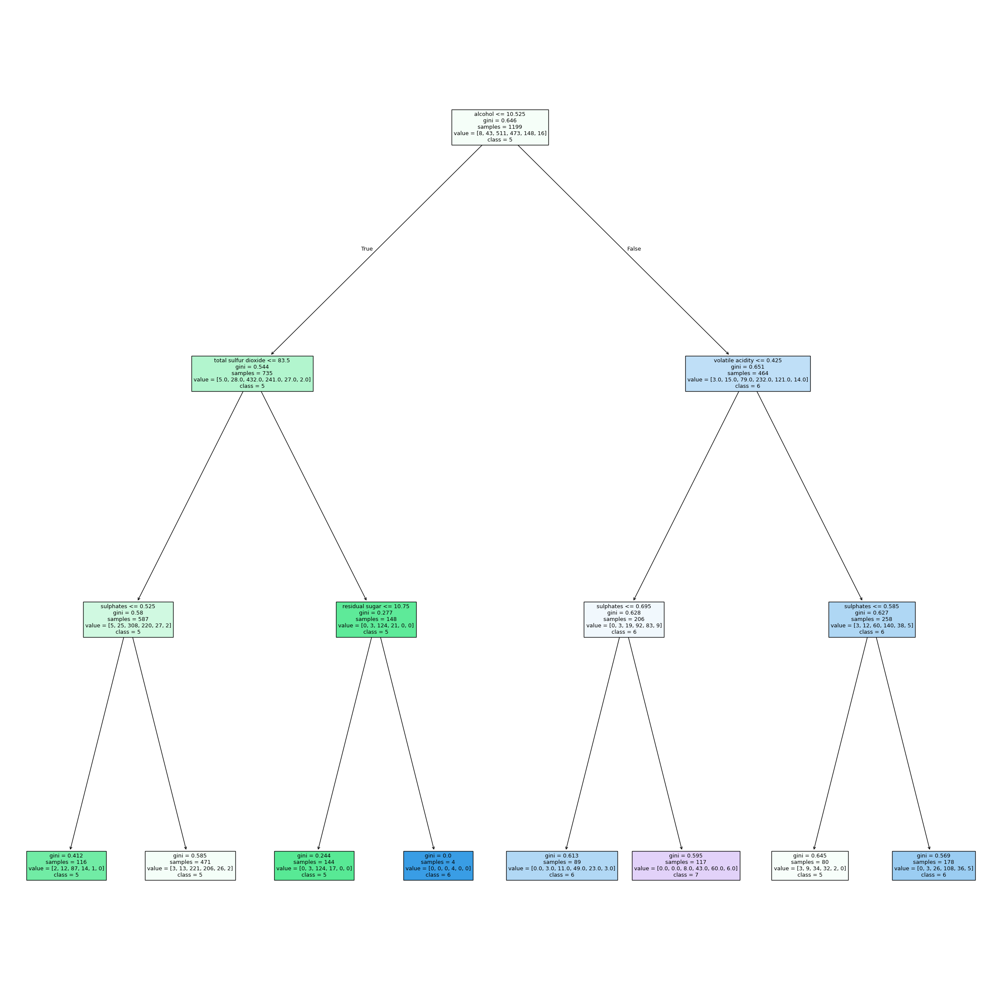

In [147]:
dt_model = DecisionTreeClassifier(max_depth=3).fit(x_train, y_train)
plt.figure(figsize=(30,30))
tree.plot_tree(dt_model, filled=True, class_names=[str(i) for i in set(y_train)], feature_names=x_train.columns)

#### Here the n_neighbors is 5 so find the best value using the GridSeachCV

In [200]:
pram={
    "n_neighbors" :[3,5,7,9,11,13,17,21,23,25],
    "weights" :['uniform', 'distance'],
    "algorithm" : ['auto', 'ball_tree', 'kd_tree', 'brute'],
    "leaf_size" :[10,15,20,25,30,35,40,45,50],
    "p":[1,2]
}

In [202]:
grid_cv=GridSearchCV(knn,param_grid=pram)

In [204]:
grid_cv.fit(x_train,y_train)

,estimator,KNeighborsClassifier()
,param_grid,"{'algorithm': ['auto', 'ball_tree', ...], 'leaf_size': [3, 5, ...], 'n_neighbors': [13, 17, ...], 'p': [1, 2], ...}"
,scoring,None
,n_jobs,None
,refit,True
,cv,None
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,n_neighbors,30


In [205]:
grid_cv.best_params_

{'algorithm': 'auto',
 'leaf_size': 3,
 'n_neighbors': 30,
 'p': 1,
 'weights': 'distance'}

### Based on these value Build the knn model

In [215]:
knn_new=KNeighborsClassifier(n_neighbors=25,p=1,leaf_size =10,weights="distance")

In [217]:
knn_new.fit(x_train,y_train)

,n_neighbors,25
,weights,'distance'
,algorithm,'auto'
,leaf_size,10
,p,1
,metric,'minkowski'
,metric_params,None
,n_jobs,None


In [219]:
knn_new.score(x_test,y_test)

0.65

### predict the model

In [247]:
knn_new.predict([x_test.iloc[0]])

C:\Users\subod\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


array([6], dtype=int64)

In [249]:
x_test.iloc[0]

fixed acidity            7.10000
volatile acidity         0.27000
citric acid              0.60000
residual sugar           2.10000
chlorides                0.07400
free sulfur dioxide     17.00000
total sulfur dioxide    25.00000
density                  0.99814
pH                       3.38000
sulphates                0.72000
alcohol                 10.60000
Name: 1508, dtype: float64

In [241]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
y_pred = knn_new.predict(x_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred, zero_division=0))

Accuracy: 0.65
[[  0   0   2   0   0   0]
 [  0   0   3   7   0   0]
 [  0   0 137  32   1   0]
 [  0   0  53 104   8   0]
 [  0   0  10  22  19   0]
 [  0   0   0   2   0   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00         2
           4       0.00      0.00      0.00        10
           5       0.67      0.81      0.73       170
           6       0.62      0.63      0.63       165
           7       0.68      0.37      0.48        51
           8       0.00      0.00      0.00         2

    accuracy                           0.65       400
   macro avg       0.33      0.30      0.31       400
weighted avg       0.63      0.65      0.63       400



### save the model

In [225]:
import joblib
joblib.dump(knn_new, "knn_model.pkl")

['knn_model.pkl']